In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


# ***LOADING THE DATASET***

In [ ]:
file_path = "/content/drive/MyDrive/Colab Notebooks/LinkedIn_Engagement_Dataset.csv"
df = pd.read_csv(file_path)
df.head(10)



,Full Name,Workplace,Location,Connections,Followers,Number of Experiences,Number of Educations,Number of Skills,Number of Projects,Number of Publications,...,Engagement Rate (%),Last Active Date,Post Frequency,Most Engaged Post Type,Years of Experience,Job Changes in Last 5 Years,Promotion Count,Industry,Sentiment of Recent Posts,LinkedIn Profile Popularity Score
0,Sneha Joshi,Amazon,Australia,1368,18659,14,3,47,3,4,...,3.15,01-01-2023,Monthly,Image,15,2,1,Education,Positive,85.82
1,Isha Bansal,Amazon,Canada,875,9953,2,4,27,2,4,...,2.52,02-01-2023,Monthly,Text,25,0,2,Education,Positive,19.89
2,Priya Verma,Freelancer,Australia,492,6879,5,4,45,5,1,...,5.32,03-01-2023,Monthly,Video,15,3,0,Tech,Negative,46.62
3,Priya Verma,Freelancer,UK,4500,10143,12,1,37,5,2,...,9.62,04-01-2023,Weekly,Article,1,1,1,Marketing,Neutral,42.93
4,Swati Rajan,Amazon,UK,1897,10976,6,4,49,2,4,...,3.20,05-01-2023,Daily,Image,13,4,1,Finance,Negative,34.38
5,Varun Bhatia,Microsoft,UK,2630,14948,3,1,25,9,2,...,8.72,06-01-2023,Daily,Video,7,1,2,Consulting,Negative,88.80
6,Karthik Nair,Startup,Germany,977,142,10,3,18,8,4,...,6.08,07-01-2023,Daily,Image,15,2,1,Education,Positive,82.66
7,Ritika Jain,Startup,Germany,4615,10935,3,3,47,5,1,...,1.67,08-01-2023,Rarely,Image,16,0,0,Education,Neutral,59.84
8,Manish Kulkarni,Freelancer,Germany,3537,19444,8,3,30,8,4,...,3.25,09-01-2023,Rarely,Text,23,4,0,Finance,Positive,32.81
9,Rohan Iyer,Freelancer,Canada,2334,3521,14,2,40,6,3,...,3.32,10-01-2023,Daily,Video,18,3,1,Marketing,Neutral,83.27


# **DATA PRE PROCESSING  &  OUTLIERS DETECTION USING BOXPLOT**

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 26 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Full Name                          5000 non-null   object 
 1   Workplace                          5000 non-null   object 
 2   Location                           5000 non-null   object 
 3   Connections                        5000 non-null   int64  
 4   Followers                          5000 non-null   int64  
 5   Number of Experiences              5000 non-null   int64  
 6   Number of Educations               5000 non-null   int64  
 7   Number of Skills                   5000 non-null   int64  
 8   Number of Projects                 5000 non-null   int64  
 9   Number of Publications             5000 non-null   int64  
 10  Number of Languages                5000 non-null   int64  
 11  Number of Interests                5000 no

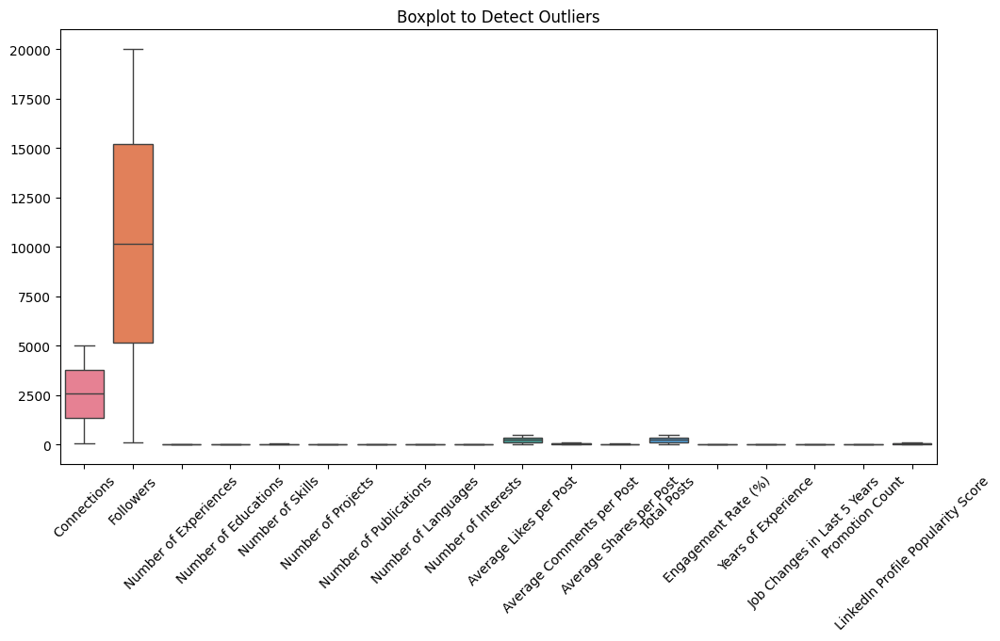


Data Preprocessing Complete! Processed dataset saved.


In [ ]:


file_path = "/content/drive/MyDrive/Colab Notebooks/LinkedIn_Engagement_Dataset.csv"


df = pd.read_csv(file_path)


print("Dataset Info:")
df.info()
print("\nFirst 5 rows of the dataset:")
print(df.head())

print("\nMissing Values Count:")
print(df.isnull().sum())


df.dropna(inplace=True)


print("\nDuplicate Rows Count:", df.duplicated().sum())

# Visualizing outliers using a boxplot
plt.figure(figsize=(12, 6))
sns.boxplot(data=df)
plt.xticks(rotation=45)
plt.title("Boxplot to Detect Outliers")
plt.show()

if "Engagement_Score" in df.columns and "Impressions" in df.columns:
    df["Engagement_Ratio"] = df["Engagement_Score"] / df["Impressions"]



# Convert categorical variables using One-Hot Encoding
categorical_columns = ["Workplace", "Location", "Post Frequency",
                       "Most Engaged Post Type", "Industry", "Sentiment of Recent Posts"]

df = pd.get_dummies(df, columns=categorical_columns, drop_first=True)




processed_file_path = "/content/drive/MyDrive/Processed_Data.csv"
df.to_csv(processed_file_path, index=False)

print("\nData Preprocessing Complete! Processed dataset saved.")





In [ ]:


df.columns = df.columns.str.strip()

# List of original string-based columns to drop
columns_to_drop = ["Full Name", "Workplace", "Location", "Last Active Date",
                   "Most Engaged Post Type", "Industry", "Sentiment of Recent Posts"]

df = df.drop(columns=columns_to_drop, errors='ignore')

# Verify if columns are dropped
df.to_csv("/content/drive/MyDrive/Processed_Data.csv", index=False)

print("String-based columns dropped and dataset updated successfully!")











String-based columns dropped and dataset updated successfully!


# ***FEATURE ENGINEERING***

In [ ]:


df.drop(columns=['Engagement Rate'], errors='ignore', inplace=True)

# Normalize the selected features to bring them to a comparable scale
from sklearn.preprocessing import MinMaxScaler

# Selecting relevant features
features = ['Connections', 'Total Posts', 'Average Likes per Post', 'Average Comments per Post',
            'Average Shares per Post', 'Post Frequency_Rarely', 'Promotion Count']



# Creating the new balanced Engagement Score
df['Engagement Score'] = (
    (0.2 * df['Connections']) +
    (0.15 * df['Total Posts']) +
    (0.2 * df['Average Likes per Post']) +
    (0.15 * df['Average Comments per Post']) +
    (0.1 * df['Average Shares per Post']) +
    (0.1 * df['Post Frequency_Rarely']) +
    (0.1 * df['Promotion Count'])
)

df.to_csv("/content/drive/MyDrive/Colab Notebooks/Processed_Data_updated.csv", index=False)


# Check new correlations
print(df.corr()['Engagement Score'].sort_values(ascending=False))


Engagement Score                     1.000000
Connections                          0.481585
Average Likes per Post               0.458171
Post Frequency_Rarely                0.369333
Average Comments per Post            0.353273
Promotion Count                      0.344916
Total Posts                          0.344841
Average Shares per Post              0.231457
Number of Languages                  0.038374
Location_India                       0.020446
Number of Projects                   0.017992
Number of Interests                  0.015581
Years of Experience                  0.014573
Job Changes in Last 5 Years          0.008302
Number of Publications               0.008158
Followers                            0.005535
Number of Educations                 0.001939
LinkedIn Profile Popularity Score    0.000040
Number of Skills                    -0.003579
Number of Experiences               -0.011728
Workplace_Freelancer                -0.014862
Post Frequency_Weekly             

# ***RANDOM FOREST MODEL TRAINING***

In [ ]:

from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Define features (X) and target variable (y)
X = df.drop(columns=["Engagement Score"])
y = df["Engagement Score"]

# Split the data into training & testing sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train Random Forest Model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predictions
y_pred = rf_model.predict(X_test)

# Model Evaluation
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)

print(f"Random Forest Model Evaluation:")
print(f"MAE (Mean Absolute Error): {mae:.4f}")
print(f"MSE (Mean Squared Error): {mse:.4f}")
print(f"RMSE (Root Mean Squared Error): {rmse:.4f}")
print(f"R² Score: {r2:.4f}")


Random Forest Model Evaluation:
MAE (Mean Absolute Error): 0.0244
MSE (Mean Squared Error): 0.0010
RMSE (Root Mean Squared Error): 0.0311
R² Score: 0.9332


# **Updated Feature Importance using Random Forest**

MAE: 0.0244
MSE: 0.0010
RMSE: 0.0311
R² Score: 0.9332


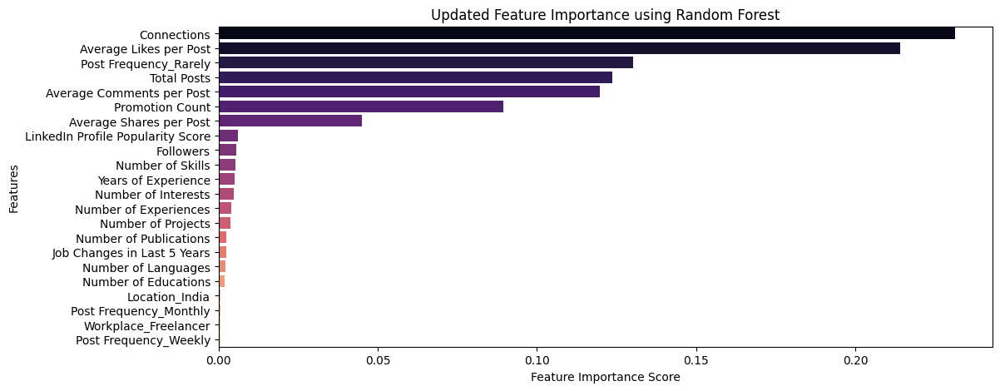

In [ ]:
# Drop low-importance columns
low_importance_features = [
    "Workplace_Startup", "Workplace_Facebook", "Workplace_Tesla", "Workplace_Microsoft", "Workplace_Google",
    "Location_USA", "Location_UK", "Location_Canada", "Location_Germany", "Industry_Finance", "Industry_Tech",
    "Industry_Marketing", "Industry_Education", "Industry_Healthcare", "Sentiment of Recent Posts_Neutral",
    "Sentiment of Recent Posts_Positive", "Most Engaged Post Type_Image", "Most Engaged Post Type_Video",
    "Most Engaged Post Type_Text"
]

df = df.drop(columns=low_importance_features, errors='ignore')

# Split the data again
X = df.drop(columns=["Engagement Score"])  # Features
y = df["Engagement Score"]  # Target



# Train the Random Forest again
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predictions
y_pred = rf_model.predict(X_test)

# Evaluate
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R² Score: {r2:.4f}")

# Re-check Feature Importance
import matplotlib.pyplot as plt
import seaborn as sns

feature_importances = rf_model.feature_importances_
sorted_indices = feature_importances.argsort()[::-1]
sorted_features = X.columns[sorted_indices]
sorted_importances = feature_importances[sorted_indices]

plt.figure(figsize=(12, 5))
sns.barplot(x=sorted_importances, y=sorted_features, palette="magma")
plt.title("Updated Feature Importance using Random Forest")
plt.xlabel("Feature Importance Score")
plt.ylabel("Features")
plt.show()


# **Actual vs Predicted Engagement Scores**

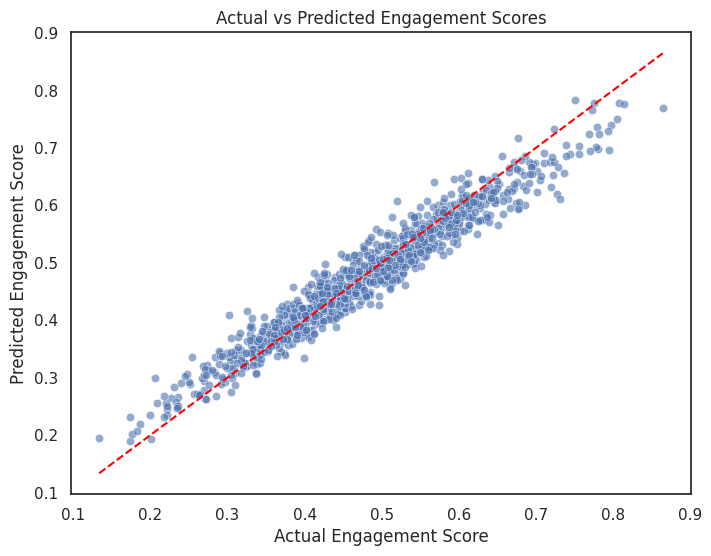

In [ ]:
# Predict on test data
y_pred = rf_model.predict(X_test)

# Scatter Plot: Actual vs Predicted
plt.figure(figsize=(8,6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.6)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--') # Perfect line
plt.xlabel("Actual Engagement Score")
plt.ylabel("Predicted Engagement Score")
plt.title("Actual vs Predicted Engagement Scores")
plt.show()




# **Residual Plot: Distribution of Errors**

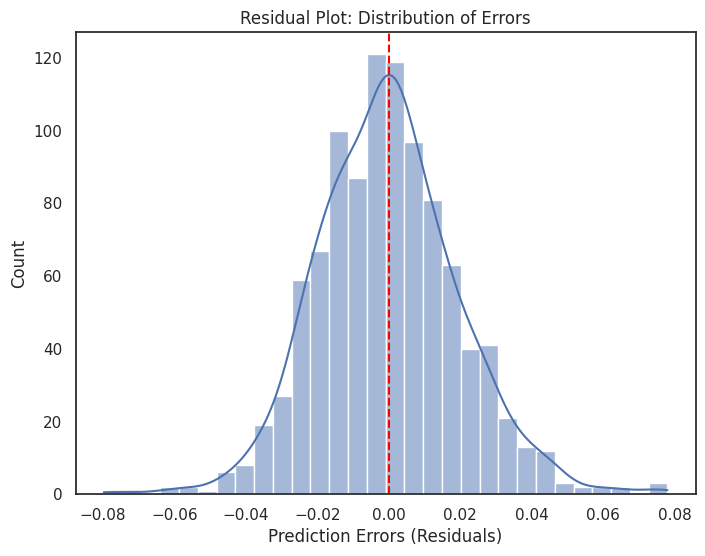

In [ ]:
residuals = y_test - y_pred
plt.figure(figsize=(8,6))
sns.histplot(residuals, bins=30, kde=True)
plt.axvline(0, color='red', linestyle='--')  # Zero error reference
plt.xlabel("Prediction Errors (Residuals)")
plt.ylabel("Count")
plt.title("Residual Plot: Distribution of Errors")
plt.show()

# **Residual Distribution Plot**

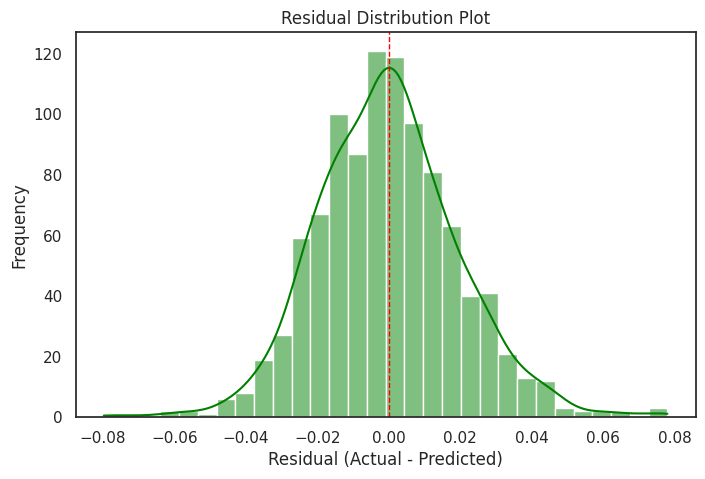

In [ ]:
# Calculate residuals
residuals = y_test - y_pred

# Plot residuals
plt.figure(figsize=(8,5))
sns.histplot(residuals, bins=30, kde=True, color='green')
plt.axvline(0, color='red', linestyle='dashed', linewidth=1)  # Zero-error reference line
plt.xlabel("Residual (Actual - Predicted)")
plt.ylabel("Frequency")
plt.title("Residual Distribution Plot")
plt.show()

# ***XG-BOOST MODEL TRAINING***

In [ ]:
import joblib  # For saving/loading the trained model
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

#Step 1: Load the Updated Dataset
df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Processed_Data_updated.csv")

#Step 2: Define Features & Target Variable
X = df.drop(columns=['Engagement Score'])  # Input features
y = df['Engagement Score']  # Target variable

#Step 3: Train-Test Split (80% Train, 20% Test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#Step 4: Train XGBoost Model
xgb_model = XGBRegressor(
    n_estimators=1000,  # Number of trees
    max_depth=8,  # Tree depth to capture patterns
    learning_rate=0.05,  # Smaller = better generalization
    subsample=0.8,  # Uses 80% of data per tree
    colsample_bytree=0.8,  # Uses 80% of features per tree
    random_state=42
)

xgb_model.fit(X_train, y_train)  # Train the model

#Step 5: Predictions & Evaluation
y_pred = xgb_model.predict(X_test)

# Compute Additional Metrics
r2 = r2_score(y_test, y_pred)  # R² Score
mae = mean_absolute_error(y_test, y_pred)  # Mean Absolute Error
mse = mean_squared_error(y_test, y_pred)  # Mean Squared Error
rmse = mse ** 0.5  # Root Mean Squared Error

#Print Model Evaluation Results
print(f"\n Model Evaluation Metrics:")
print(f" R² Score: {r2:.4f}")
print(f" MAE: {mae:.4f}")
print(f" MSE: {mse:.4f}")
print(f" RMSE: {rmse:.4f}\n")





 Model Evaluation Metrics:
 R² Score: 0.9732
 MAE: 0.0152
 MSE: 0.0004
 RMSE: 0.0197



# **XGBoost Feature Importance for Engagement Score**

Feature names length: 22
Importance values length: 22


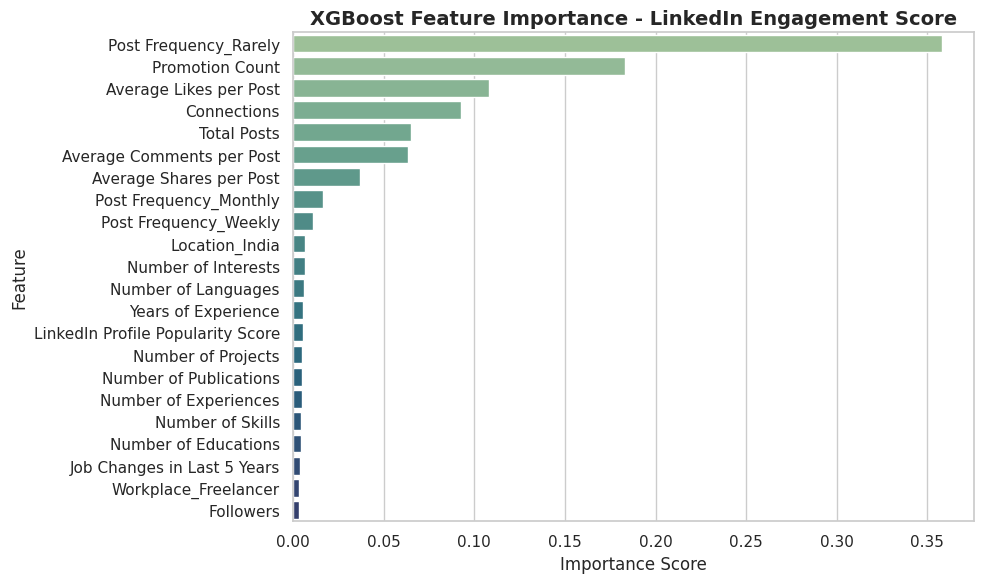

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Get feature importances from your trained model
importances = xgb_model.feature_importances_
feature_names = X_train.columns

# Ensure lengths match (just in case)
print("Feature names length:", len(feature_names))
print("Importance values length:", len(importances))

# Create DataFrame for plotting
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=importance_df,
            palette=sns.color_palette("crest", n_colors=len(importance_df)))  # <- crest palette here
plt.title('XGBoost Feature Importance - LinkedIn Engagement Score', fontsize=14, fontweight="bold")
plt.xlabel('Importance Score', fontsize=12)
plt.ylabel('Feature', fontsize=12)
plt.tight_layout()
plt.show()



 ***SAVING AND LOADING THE MODEL***

In [ ]:
#Step 6: Save the Trained Model
joblib.dump(xgb_model, "best_xgboost_model.pkl")
print("Model Saved Successfully as 'best_xgboost_model.pkl'")


#Load the saved model
loaded_model = joblib.load("/content/drive/MyDrive/Colab Notebooks/best_xgboost_model.pkl")



#Get Predictions for the First 5 Rows of the ORIGINAL Dataset
original_first_5 = X.iloc[:5]
original_actual_values = y.iloc[:5]

original_predictions = loaded_model.predict(original_first_5)

#Print Side-by-Side Comparison
print("Predicted vs Actual Engagement Scores (First 5 from Original Dataset):")
for i in range(5):
    print(f"Predicted: {original_predictions[i]:.4f} |  Actual: {original_actual_values.iloc[i]:.4f}")






Model Saved Successfully as 'best_xgboost_model.pkl'
Predicted vs Actual Engagement Scores (First 5 from Original Dataset):
Predicted: 0.5490 |  Actual: 0.5481
Predicted: 0.4872 |  Actual: 0.4875
Predicted: 0.2661 |  Actual: 0.2654
Predicted: 0.4831 |  Actual: 0.4829
Predicted: 0.5306 |  Actual: 0.5310


In [ ]:
import joblib

#  Load the saved model
model = joblib.load("best_xgboost_model.pkl")

# Define ALL 22 features (even if some are not needed, set them to 0)
sample_data = np.array([[500, 200, 50, 15, 1, 30, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])  # Adjust as needed

# Convert to DataFrame with correct feature names
feature_columns = model.get_booster().feature_names  # Get correct feature names
sample_df = pd.DataFrame(sample_data, columns=feature_columns)

# Make Prediction
prediction = model.predict(sample_df)

# Print Result
print(f" Predicted Engagement Score: {prediction[0]:.2f}")


 Predicted Engagement Score: 0.35


In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Predict engagement scores for the test set
y_pred = model.predict(X_test)

# Compare predictions with actual values
comparison_df = pd.DataFrame({"Actual": y_test.values, "Predicted": y_pred})
print(comparison_df.head(10))  # Show first 10 rows




     Actual  Predicted
0  0.375455   0.390298
1  0.483479   0.479481
2  0.439342   0.446339
3  0.610174   0.578968
4  0.459583   0.467184
5  0.440348   0.458730
6  0.423781   0.406396
7  0.539503   0.540434
8  0.512738   0.522865
9  0.497086   0.491882


# **Engagement Score Distribution**

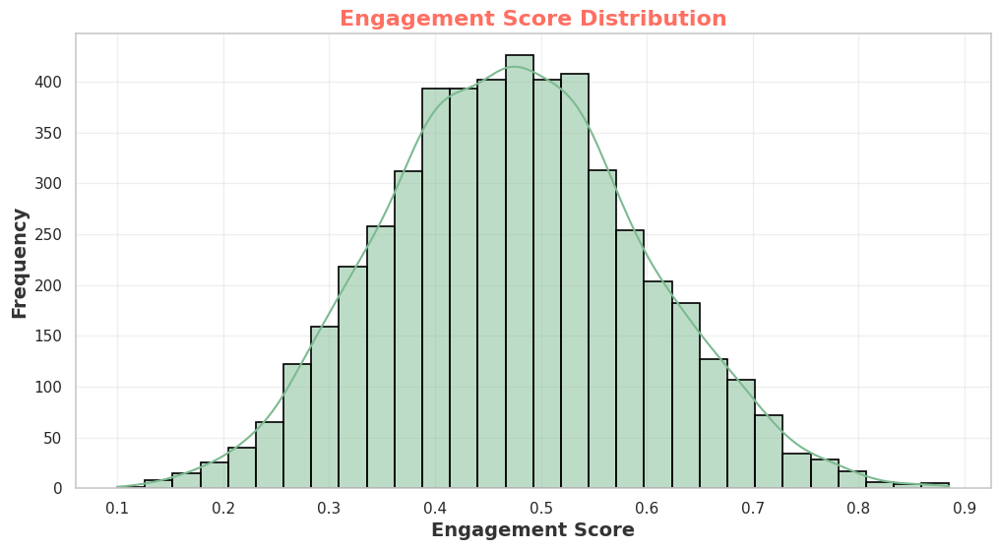

In [ ]:
# Histogram of Engagement Scores
plt.figure(figsize=(12, 6))
sns.histplot(y, bins=30, kde=True, color=sns.color_palette("crest")[0], edgecolor='black', linewidth=1.2)
plt.xlabel("Engagement Score", fontsize=14, fontweight="bold", color="#333333")
plt.ylabel("Frequency", fontsize=14, fontweight="bold", color="#333333")
plt.title("Engagement Score Distribution", fontsize=16, fontweight="bold", color="#ff6f61")
plt.grid(alpha=0.3)
plt.show()


# **Box Plot of Features to Detect Outliers**

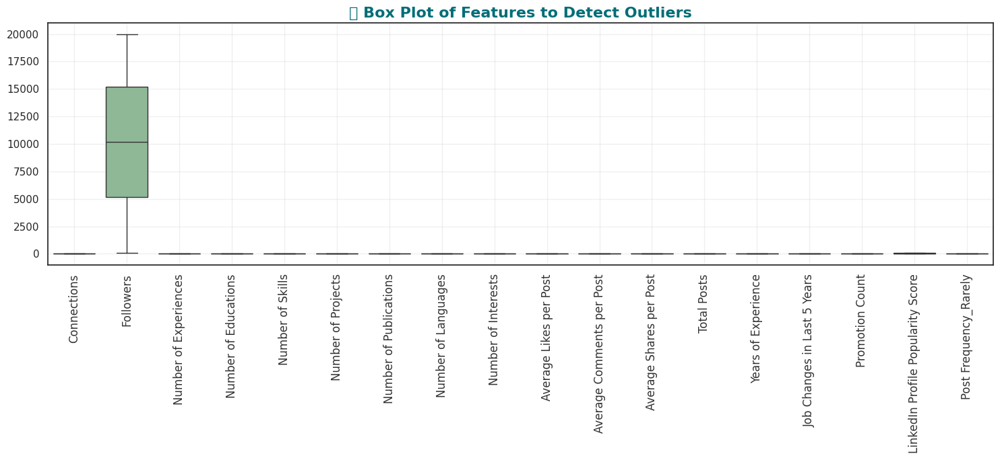

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

plt.figure(figsize=(15, 7))

# Use crest palette
sns.boxplot(data=X.select_dtypes(include=[np.number]), palette="crest")

# Styling
plt.xticks(rotation=90, fontsize=12, color="#333333")
plt.title(" Box Plot of Features to Detect Outliers", fontsize=16, fontweight="bold", color="#006d77")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


# **Pairplot of Features**

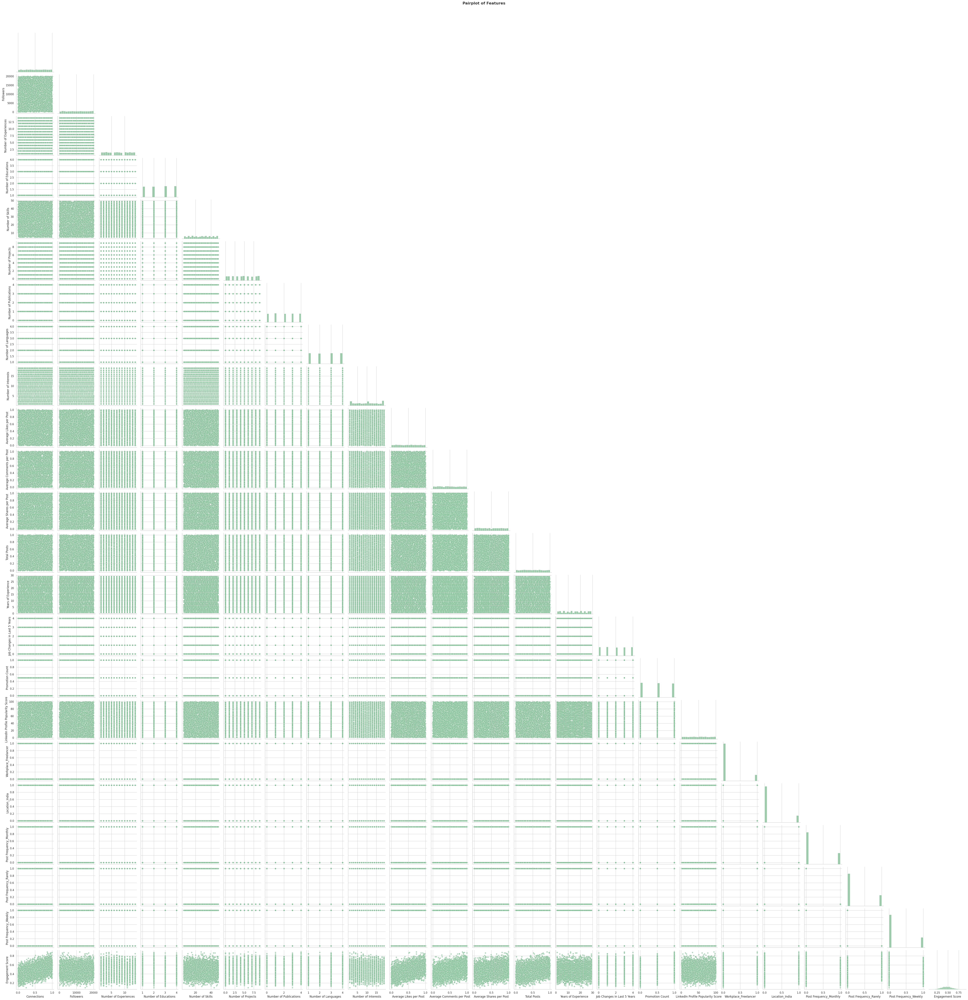

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set crest color palette globally
sns.set_palette(sns.color_palette("crest"))

# Pairplot
sns.pairplot(df, corner=True, plot_kws={'alpha': 0.6})
plt.suptitle("Pairplot of Features", fontsize=16, fontweight="bold", color="#333333", y=1.02)
plt.show()



# **Connections vs Engagement Score**

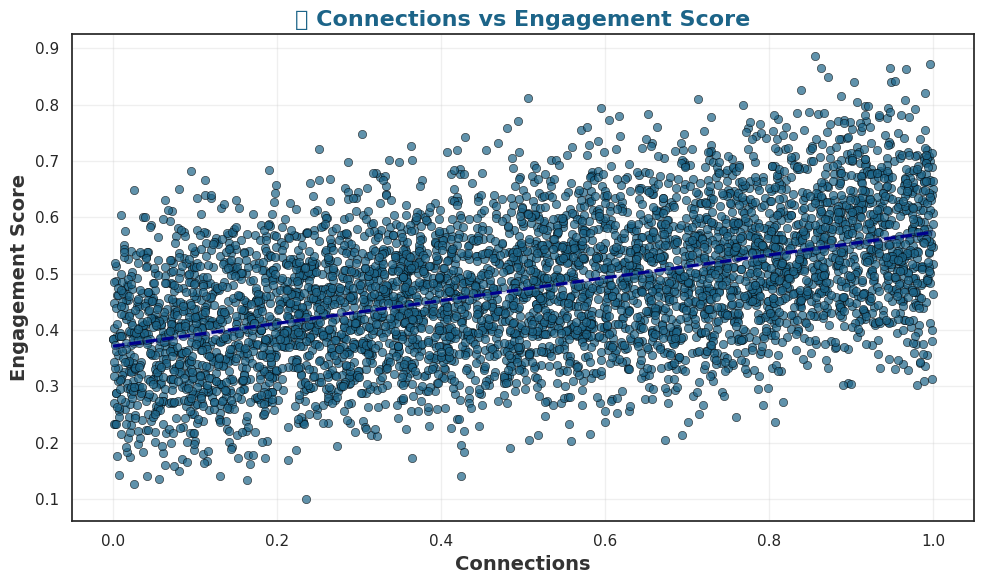

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Get a color from the 'crest' palette
crest_color = sns.color_palette("crest", as_cmap=False)[4]  # Pick a mid-tone

plt.figure(figsize=(10, 6))
key_feature = X.columns[0]

# Scatterplot
sns.scatterplot(x=df[key_feature], y=y, color=crest_color, alpha=0.7, edgecolor="black")

# Regression line
sns.regplot(x=df[key_feature], y=y, scatter=False, color="darkblue", line_kws={"linestyle": "dashed"})

# Labels & title
plt.xlabel(key_feature, fontsize=14, fontweight="bold", color="#333333")
plt.ylabel("Engagement Score", fontsize=14, fontweight="bold", color="#333333")
plt.title(f" {key_feature} vs Engagement Score", fontsize=16, fontweight="bold", color=crest_color)

plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


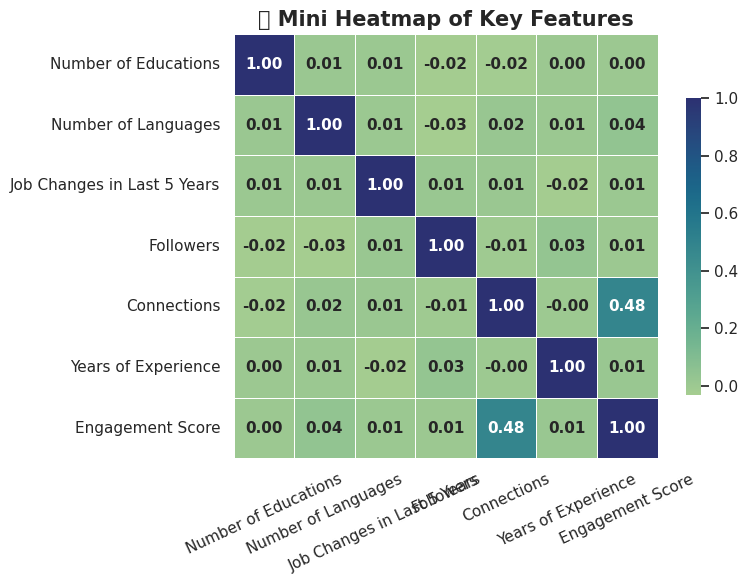

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Selecting only relevant features
selected_features = [
    'Number of Educations',
    'Number of Languages',
    'Job Changes in Last 5 Years',
    'Followers',
    'Connections',
    'Years of Experience',
    'Engagement Score'  #  fixed this line
]

# Create new filtered DataFrame
df_reduced = df[selected_features]

# Compute correlation matrix
corr = df_reduced.corr()

# Plot mini heatmap
plt.figure(figsize=(8, 6))
sns.set(style="white")

sns.heatmap(
    corr,
    annot=True,
    fmt=".2f",
    cmap="crest",
    linewidths=0.5,
    square=True,
    cbar_kws={"shrink": .7},
    annot_kws={"size": 11, "weight": "bold"}
)

plt.title(" Mini Heatmap of Key Features", fontsize=15, weight='bold')
plt.xticks(rotation=25)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


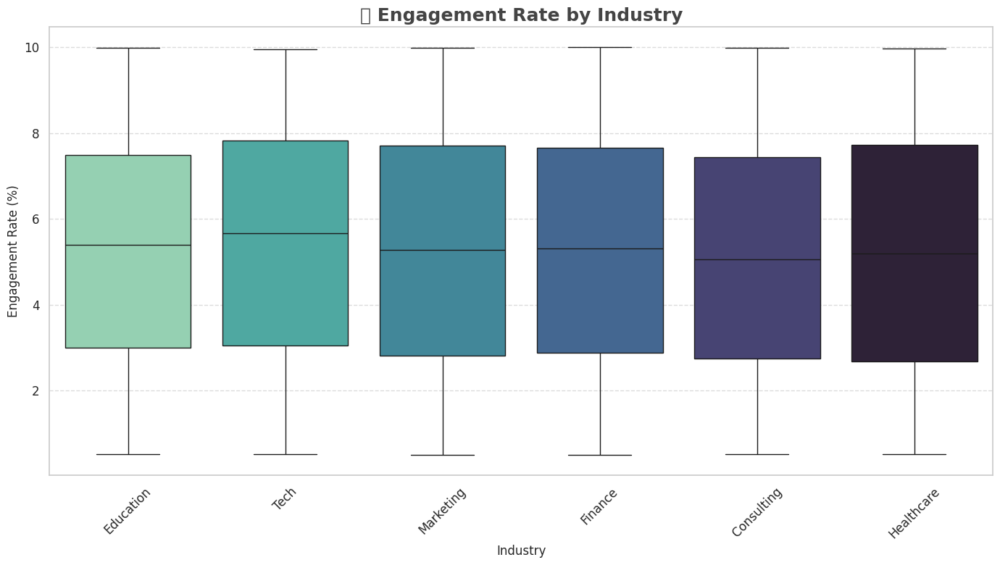

In [ ]:
plt.figure(figsize=(14, 8))
custom_palette = sns.color_palette("mako_r")

sns.boxplot(
    data=df,
    x='Industry',
    y='Engagement Rate (%)',
    palette=custom_palette
)

plt.title("Engagement Rate by Industry", fontsize=18, weight='bold', color='#444')
plt.xlabel("Industry", fontsize=12)
plt.ylabel("Engagement Rate (%)", fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


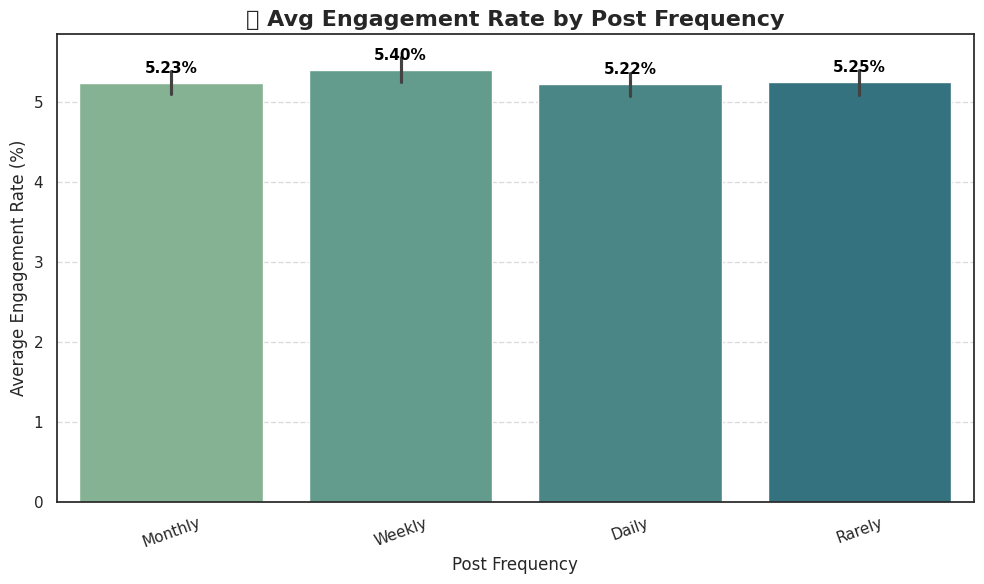

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
palette = sns.color_palette("crest")

# Barplot
ax = sns.barplot(
    data=df,
    x='Post Frequency',
    y='Engagement Rate (%)',
    estimator='mean',
    errorbar='ci',
    palette=palette
)

# Add data labels
for bar in ax.patches:
    height = bar.get_height()
    ax.annotate(
        f'{height:.2f}%',                   # Format: xx.xx%
        xy=(bar.get_x() + bar.get_width() / 2, height),
        xytext=(0, 5),                      # Offset label above bar
        textcoords="offset points",
        ha='center', va='bottom',
        fontsize=11, weight='bold',
        color='black'
    )

# Styling
plt.title("Avg Engagement Rate by Post Frequency", fontsize=16, weight='bold')
plt.xlabel("Post Frequency", fontsize=12)
plt.ylabel("Average Engagement Rate (%)", fontsize=12)
plt.xticks(rotation=20)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


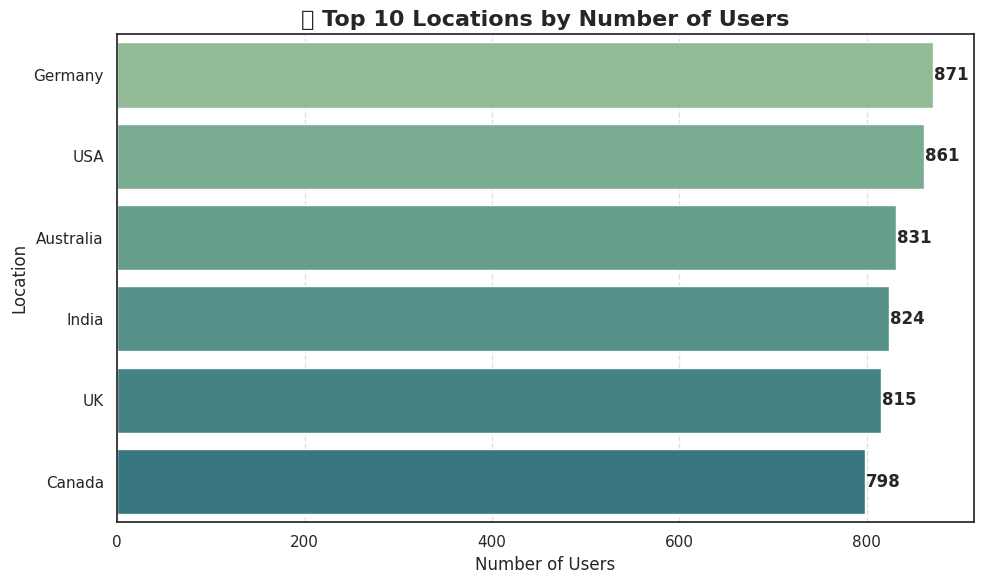

In [ ]:
# Count top 10 locations
top_locations = df['Location'].value_counts().nlargest(10)

# Plot
plt.figure(figsize=(10, 6))
colors = sns.color_palette("crest", n_colors=10)  # Updated to 'crest'

# Horizontal barplot
ax = sns.barplot(
    x=top_locations.values,
    y=top_locations.index,
    palette=colors
)

# Add data labels on bars
for i, v in enumerate(top_locations.values):
    ax.text(v + 1, i, str(v), va='center', fontweight='bold')

# Styling
plt.title(" Top 10 Locations by Number of Users", fontsize=16, weight='bold')
plt.xlabel("Number of Users", fontsize=12)
plt.ylabel("Location", fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


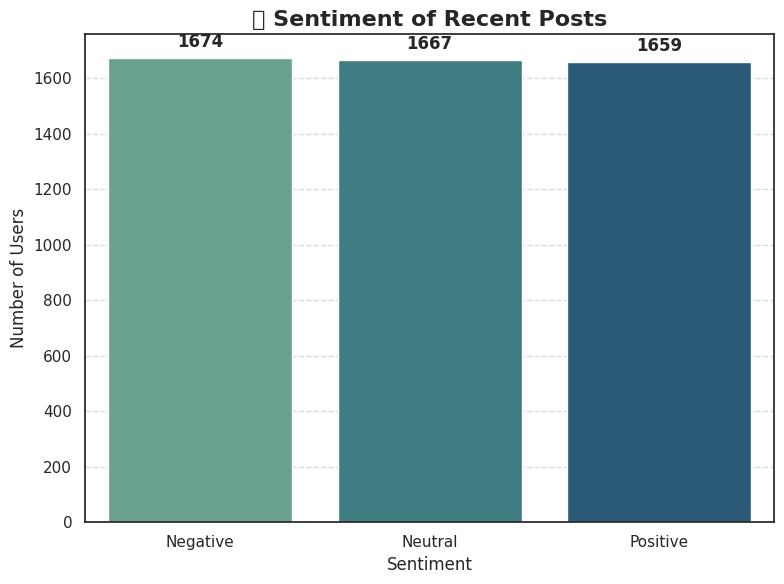

In [ ]:
# Prepare data
sentiment_counts = df['Sentiment of Recent Posts'].value_counts()

# Plot
plt.figure(figsize=(8, 6))
colors = sns.color_palette("crest", n_colors=len(sentiment_counts))  # Updated to crest

ax = sns.barplot(
    x=sentiment_counts.index,
    y=sentiment_counts.values,
    palette=colors
)

# Add data labels on top of bars
for bar in ax.patches:
    height = bar.get_height()
    ax.annotate(
        f'{int(height)}',
        xy=(bar.get_x() + bar.get_width() / 2, height),
        xytext=(0, 5),
        textcoords="offset points",
        ha='center', va='bottom',
        fontweight='bold'
    )

# Styling
plt.title("Sentiment of Recent Posts", fontsize=16, weight='bold')
plt.xlabel("Sentiment", fontsize=12)
plt.ylabel("Number of Users", fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()



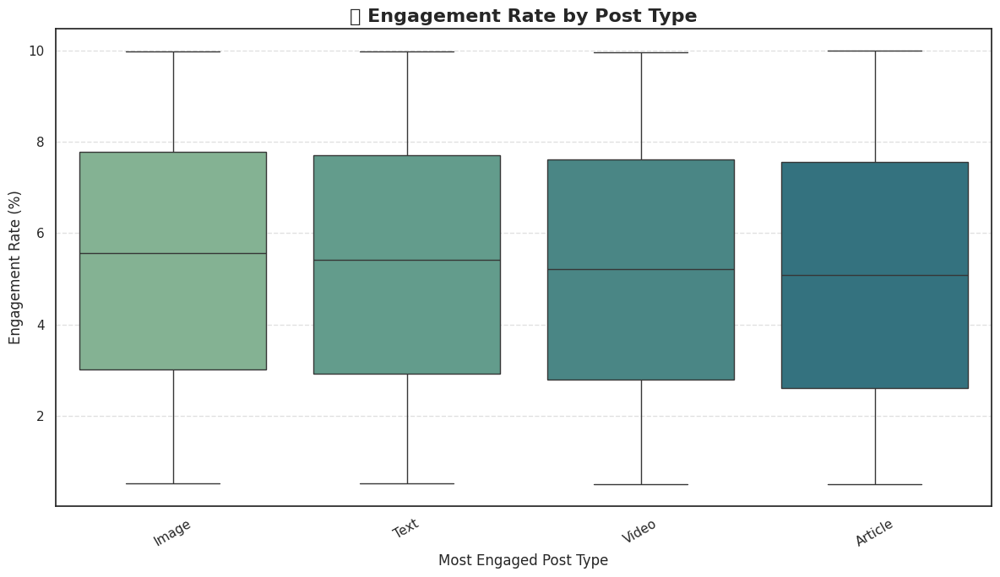

In [ ]:
plt.figure(figsize=(12, 7))

# Use the 'crest' color palette
palette = sns.color_palette("crest")

# Boxplot
sns.boxplot(
    data=df,
    x='Most Engaged Post Type',
    y='Engagement Rate (%)',
    palette=palette
)

# Styling
plt.title(" Engagement Rate by Post Type", fontsize=16, weight='bold')
plt.xlabel("Most Engaged Post Type", fontsize=12)
plt.ylabel("Engagement Rate (%)", fontsize=12)
plt.xticks(rotation=30)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


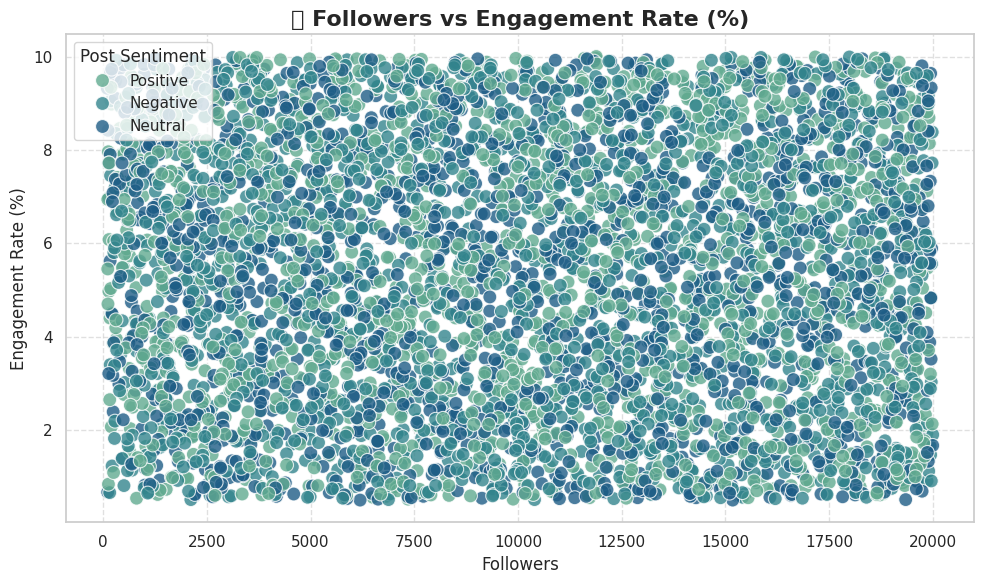

In [ ]:
plt.figure(figsize=(10, 6))
sns.set(style="whitegrid")

sns.scatterplot(
    data=df,
    x='Followers',
    y='Engagement Rate (%)',
    hue='Sentiment of Recent Posts',
    palette='crest',  # Changed palette here
    alpha=0.8,
    edgecolor='w',
    s=100
)

plt.title(" Followers vs Engagement Rate (%)", fontsize=16, weight='bold')
plt.xlabel("Followers")
plt.ylabel("Engagement Rate (%)")
plt.legend(title='Post Sentiment')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()



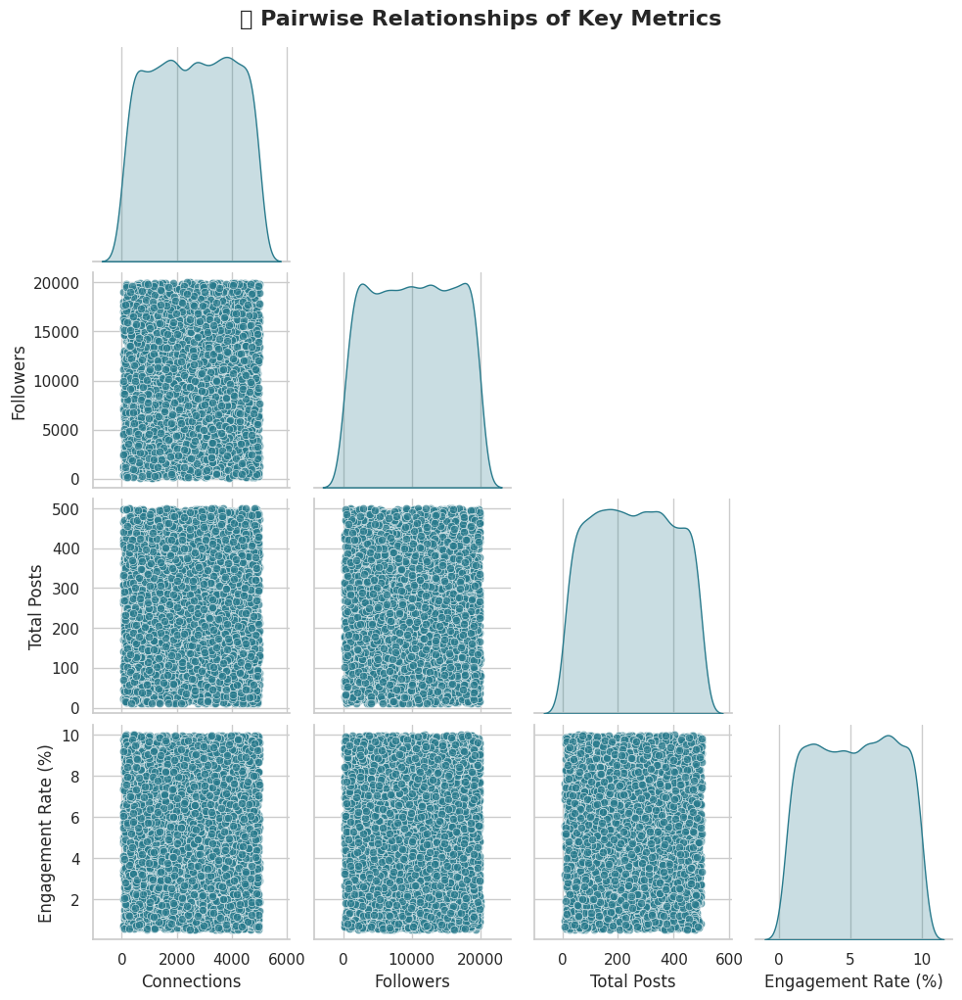

In [ ]:
features = ['Connections', 'Followers', 'Total Posts', 'Engagement Rate (%)']
sns.set(style="whitegrid")

# Apply 'crest' palette manually for all plots in the pairplot
pair = sns.pairplot(
    df[features],
    corner=True,
    kind='scatter',
    diag_kind='kde',
    plot_kws={'alpha': 0.7, 'color': sns.color_palette("crest")[3]},
    diag_kws={'color': sns.color_palette("crest")[3]}
)

pair.fig.suptitle(" Pairwise Relationships of Key Metrics", fontsize=16, weight='bold', y=1.02)
plt.show()
